In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from dataset import *
from save_load import *
from NN_library.PINN import *
from NN_library.train_primal_PINN import *
from NN_library.train_dual_PINN import *
from matplotlib.tri import Triangulation
import utility
%load_ext autoreload
%autoreload 2

Using device: cuda


In [2]:
L = 2 * np.sqrt(2) * np.pi
data = dataset_Sobol(14, [0, L], [0, L])
loaders = get_loaders_Sobol(data, 2**14+4)

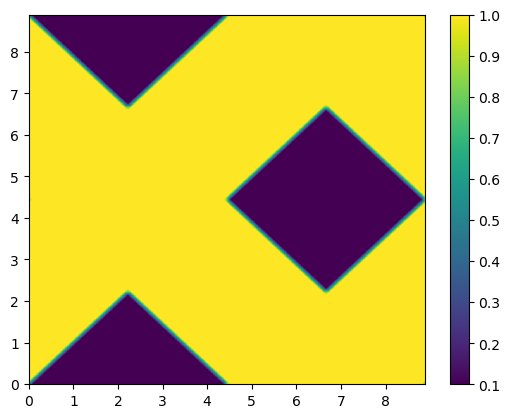

In [8]:
N = 1024 # number of nodes in each direction including the border
x = np.linspace(0, L, N, endpoint=True)
y = np.linspace(0, L, N, endpoint=True)

XY = np.meshgrid(x, y)
grid_data = torch.tensor(np.vstack((XY[0].flatten(), XY[1].flatten())).T, dtype=torch.float, device=dev)

phi=np.pi/4
R = np.array([[np.cos(phi), -np.sin(phi)], [np.sin(phi), np.cos(phi)]])

def a_function(x):
    x = R @ x.reshape(-1,2,1)
    eps = 2 * np.pi / 1e2
    x_dir = 0.5 * (np.clip(np.sin(x), -eps, eps) + eps) / eps
    a = 0.1 + 0.9*(1 - x_dir[:,0] * x_dir[:,1])
    return a

def A_interp(x):
    R_t = torch.tensor(R, device=dev, dtype=torch.float)
    x = R_t @ (x.reshape(-1,2,1))
    eps = 2 * np.pi / 1e2
    x_dir = 0.5 * (torch.clamp(torch.sin(x), -eps, eps) + eps) / eps
    a = 0.1 + 0.9*(1 - x_dir[:,0] * x_dir[:,1])
    I = torch.eye(2, device=dev).repeat(x.shape[0], 1, 1)
    A = a.view(-1,1,1) * I
    return A

def A_interp_inv(x):  
    R_t = torch.tensor(R, device=dev, dtype=torch.float)
    x = R_t @ (x.reshape(-1,2,1))
    eps = 2 * np.pi / 1e2
    x_dir = 0.5 * (torch.clamp(torch.sin(x), -eps, eps) + eps) / eps
    a = 10 - 9*(1 - x_dir[:,0] * x_dir[:,1])
    I = torch.eye(2, device=dev).repeat(x.shape[0], 1, 1)
    A = a.view(-1,1,1) * I
    return A

def A(x):  
    a = torch.where((x[:,0]<torch.pi)&(x[:,1]<torch.pi)&(x[:,0]>0)&(x[:,1]>0), 0.1, 1.).view(-1,1,1)
    I = torch.eye(2, device=dev).repeat(x.shape[0], 1, 1)
    A = a * I
    return A

def A_inv(x):  
    a = torch.where((x[:,0]<torch.pi)&(x[:,1]<torch.pi)&(x[:,0]>0)&(x[:,1]>0), 0.1, 1.).view(-1,1,1)
    I = torch.eye(2, device=dev).repeat(x.shape[0], 1, 1)
    A = (1 / a) * I
    return A

def H1(x):
    H = torch.zeros_like(x)
    H[:,0] = 1.
    return H

Z = a_function(np.vstack((XY[0].flatten(), XY[1].flatten())).T)
plt.pcolormesh(XY[0], XY[1], Z.reshape(N, N))
plt.colorbar()
#plt.scatter(data[:,0], data[:,1], s = 0.1, c='r')

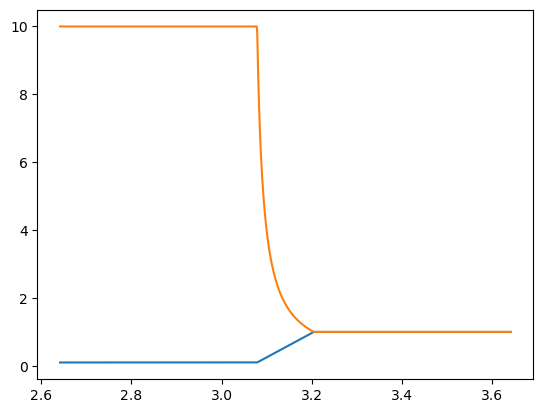

In [36]:
x = np.linspace(np.pi-0.5,np.pi+0.5,1000)
eps = 2 * np.pi / 1e2
x_dir = 0.5 * (np.clip(np.sin(x), -eps, eps) + eps) / eps
a = 0.1 + 0.9*(1 - x_dir)
plt.plot(x, a)
plt.plot(x, 1/a)

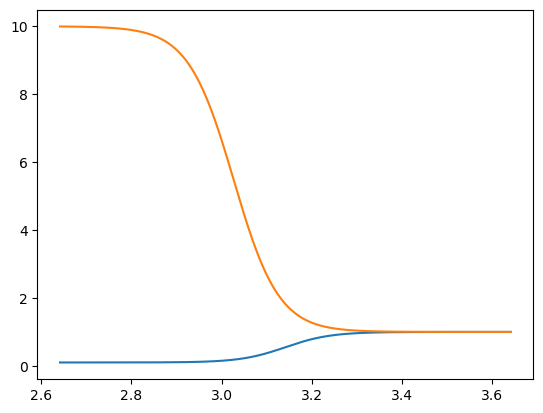

In [11]:
x = np.linspace(np.pi-0.5,np.pi+0.5,1000)
eps = 10
x_dir = 0.5 + 0.5*np.tanh(eps*np.sin(x))
a = 0.1 + 0.9*(1 - x_dir)
plt.plot(x, a)
plt.plot(x, 1/a)

# Primal PINN

In [4]:
net_primal = PINN(n_periodic=5, n_hidden=10, n_layers=2, period_len=L)
total_params = sum(p.numel() for p in net_primal.parameters())
print(f"Number of parameters: {total_params}")
args = {'lr' : 0.0001, 'epochs' : 30000, 'dev' : dev, 'name' : f'NN_library/PINN/rot/PINN_primal_{total_params}'}

Number of parameters: 391


In [ ]:
net_primal = load_network(net_primal, args['name']+'_29999', args)
net_primal = net_primal.to(dev)

In [ ]:
losses_train, losses_val = train_primal(net_primal, loaders, args, A_interp, H1, L)

In [7]:
np.save(f'NN_library/training_data/rot/PINN_primal_{total_params}', np.vstack([losses_train, losses_val]))

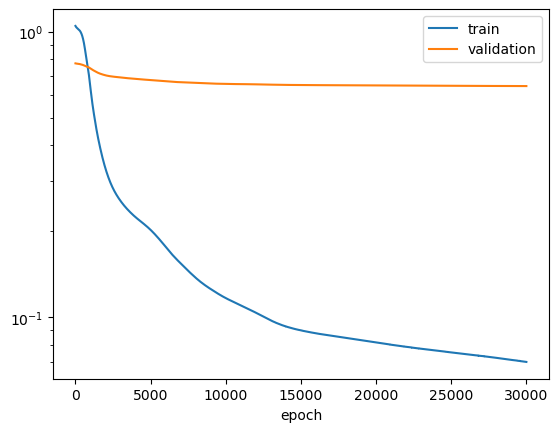

In [6]:
plt.plot(losses_train)
plt.plot(losses_val)
plt.xlabel('epoch')
plt.legend(['train', 'validation'])
plt.yscale('log')

In [22]:
U1 = net_primal(grid_data).detach().cpu()
error_1, q = PDE_loss(grid_data, net_primal, A_interp, H1)

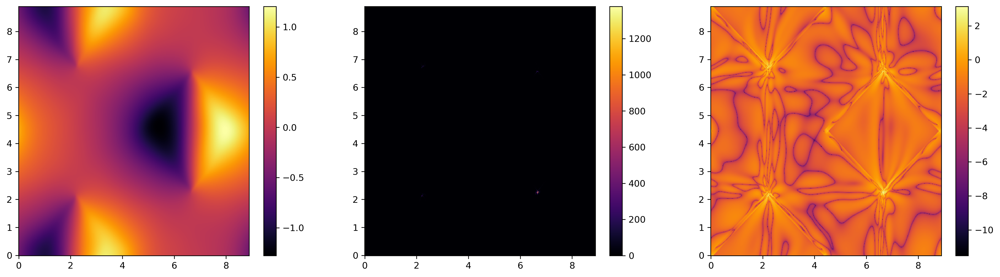

In [12]:
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(19.5,5), dpi=300)
pos1 = axs[0].pcolormesh(XY[0], XY[1], U1.reshape(N, N), cmap='inferno')
fig.colorbar(pos1, ax=axs[0])
pos2 = axs[1].pcolormesh(XY[0], XY[1], error_1.detach().cpu().reshape(N, N), cmap='inferno')
fig.colorbar(pos2, ax=axs[1])
pos3 = axs[2].pcolormesh(XY[0], XY[1], np.log10(error_1.detach().cpu().reshape(N, N)), cmap='inferno')
fig.colorbar(pos3, ax=axs[2])

In [10]:
for i, x in enumerate(loaders['train']):
    areas, tri = get_areas(x)
    areas = areas.to(args['dev'])
x = x.to(args['dev'])

_, q1 = PDE_loss(x, net_primal, A, H1)
_, q2 = PDE_loss(x, net_primal, A_interp, H1)
bound_1 = compute_bound(areas, tri, q1, L).detach()[0].item()
bound_2 = compute_bound(areas, tri, q2, L).detach()[0].item()
print(bound_1, bound_2)

np.save(f'bounds/rot/A_u_PINN_{total_params}.npy', (bound_1, bound_2))

0.8659443855285645 0.6445091962814331


In [16]:
bound_2 = compute_bound(areas, tri, q2, L).detach()
A_h = torch.zeros((2,2), device=dev)
A_h[:,0] = bound_2
A_h[:,1] = torch.flip(bound_2, dims=(0,))

In [23]:
w1 = q.view(-1,2,1) - A_h.view(1,2,2) @ H1(grid_data).view(-1,2,1)

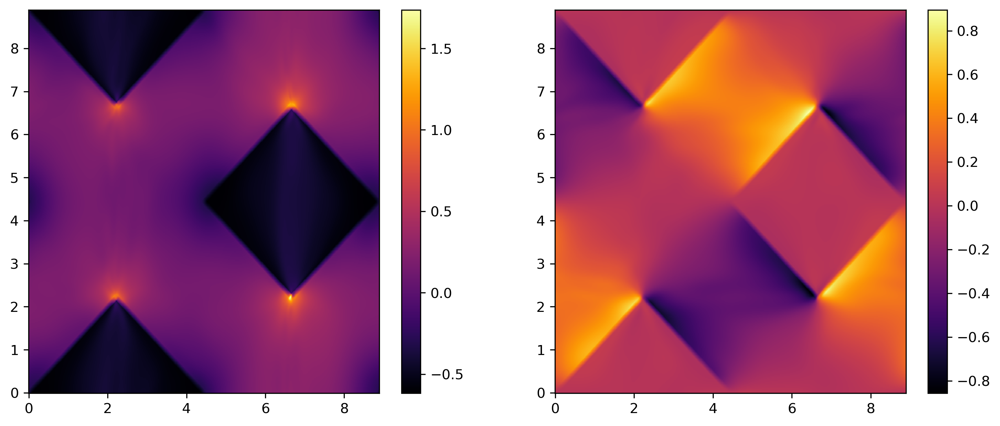

In [28]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(12.5,5), dpi=300)
pos1 = axs[0].pcolormesh(XY[0], XY[1], w1[:,0,0].detach().cpu().reshape(N, N), cmap='inferno')
fig.colorbar(pos1, ax=axs[0])
pos2 = axs[1].pcolormesh(XY[0], XY[1], w1[:,1,0].detach().cpu().reshape(N, N), cmap='inferno')
fig.colorbar(pos2, ax=axs[1])

In [41]:
dw1 = torch.zeros_like(w1[:,0,0].reshape(N, N))
dw2 = torch.zeros_like(w1[:,0,0].reshape(N, N))
dw1[:,:-1] = (w1[:,0,0].reshape(N, N)[:,1:] - w1[:,0,0].reshape(N, N)[:,:-1]) / (L/N)
dw1[:,-1] = (w1[:,0,0].reshape(N, N)[:,0] - w1[:,0,0].reshape(N, N)[:,-1]) / (L/N)
dw2[:-1,:] = (w1[:,1,0].reshape(N, N)[1:,:] - w1[:,1,0].reshape(N, N)[:-1,:]) / (L/N)
dw2[-1,:] = (w1[:,1,0].reshape(N, N)[0,:] - w1[:,1,0].reshape(N, N)[-1,:]) / (L/N)

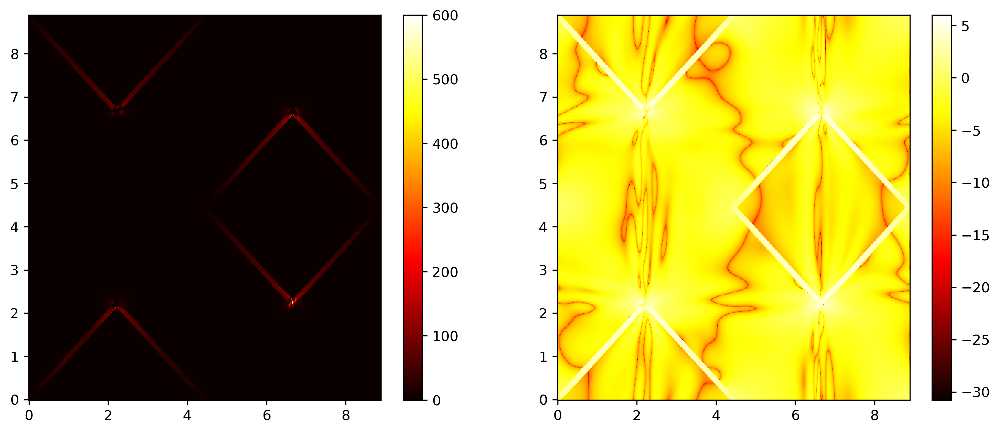

In [65]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(12.5,5), dpi=300)
pos1 = axs[0].pcolormesh(XY[0], XY[1], ((dw2-dw1)**2).detach().cpu(), cmap='hot', vmax=600)
fig.colorbar(pos1, ax=axs[0])
pos2 = axs[1].pcolormesh(XY[0], XY[1], torch.log((dw2-dw1)**2).detach().cpu(), cmap='hot', vmax=6)
fig.colorbar(pos2, ax=axs[1])

# Dual PINN

In [6]:
net_dual = PINN(n_periodic=5, n_hidden=10, n_layers=2, period_len=L)
total_params = sum(p.numel() for p in net_dual.parameters())
print(f"Number of parameters: {total_params}")
args = {'lr' : 0.0001, 'epochs' : 30000, 'dev' : dev, 'name' : f'NN_library/PINN/rot/PINN_dual_{total_params}'}

Number of parameters: 391


In [56]:
net_dual = load_network(net_dual, args['name']+'_29999', args)
net_dual = net_dual.to(dev)

In [9]:
losses_train, losses_val = train_dual(net_dual, loaders, args, A_interp_inv, H1, L)

Epoch: 0 mean train loss:  1.04445618e+02, bound:  3.06515187e-01
Epoch: 1 mean train loss:  1.04415504e+02, bound:  3.06511670e-01
Epoch: 2 mean train loss:  1.04385620e+02, bound:  3.06508243e-01
Epoch: 3 mean train loss:  1.04355965e+02, bound:  3.06504756e-01
Epoch: 4 mean train loss:  1.04326561e+02, bound:  3.06501299e-01
Epoch: 5 mean train loss:  1.04297379e+02, bound:  3.06497842e-01
Epoch: 6 mean train loss:  1.04268463e+02, bound:  3.06494445e-01
Epoch: 7 mean train loss:  1.04239792e+02, bound:  3.06491017e-01
Epoch: 8 mean train loss:  1.04211388e+02, bound:  3.06487620e-01
Epoch: 9 mean train loss:  1.04183235e+02, bound:  3.06484282e-01
Epoch: 10 mean train loss:  1.04155350e+02, bound:  3.06480885e-01
Epoch: 11 mean train loss:  1.04127724e+02, bound:  3.06477576e-01
Epoch: 12 mean train loss:  1.04100365e+02, bound:  3.06474209e-01
Epoch: 13 mean train loss:  1.04073273e+02, bound:  3.06470811e-01
Epoch: 14 mean train loss:  1.04046463e+02, bound:  3.06467414e-01
Epoch

In [14]:
np.save(f'NN_library/training_data/rot/PINN_dual_{total_params}', np.vstack([losses_train, losses_val]))

Using device: cuda


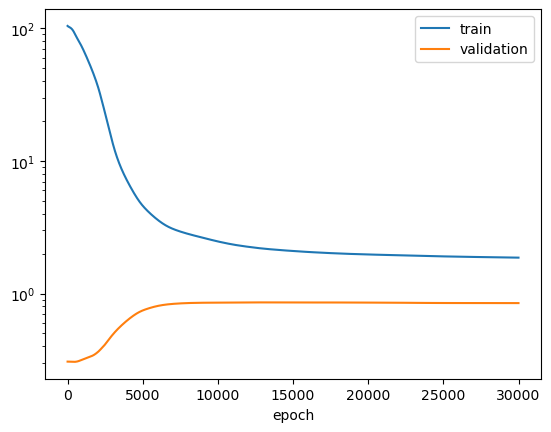

In [10]:
plt.plot(losses_train)
plt.plot(losses_val)
plt.xlabel('epoch')
plt.legend(['train', 'validation'])
plt.yscale('log')

In [59]:
U2 = net_dual(grid_data)
error_2, q_d = PDE_loss_dual(grid_data, net_dual, A_interp_inv, H1)

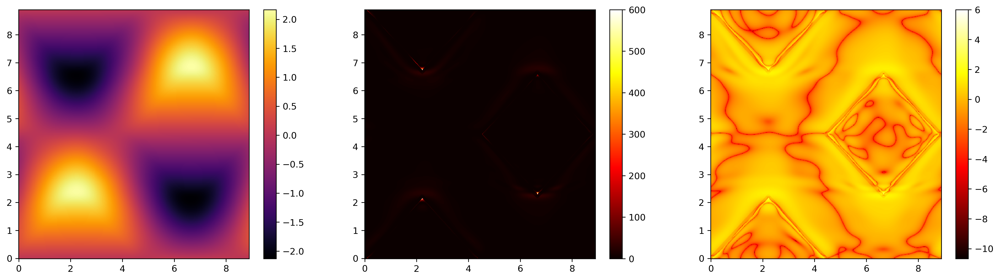

In [64]:
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(19.5,5), dpi=300)
pos1 = axs[0].pcolormesh(XY[0], XY[1], U2.detach().cpu().reshape(N, N), cmap='inferno')
fig.colorbar(pos1, ax=axs[0])
pos2 = axs[1].pcolormesh(XY[0], XY[1], error_2.detach().cpu().reshape(N, N), cmap='hot',vmax=600)
fig.colorbar(pos2, ax=axs[1])
pos3 = axs[2].pcolormesh(XY[0], XY[1], np.log10(error_2.detach().cpu().reshape(N, N)), cmap='hot', vmax=6)
fig.colorbar(pos3, ax=axs[2])

In [18]:
for i, x in enumerate(loaders['train']):
    areas, tri = get_areas(x)
    areas = areas.to(args['dev'])
x = x.to(args['dev'])

_, q1 = PDE_loss_dual(x, net_dual, A_inv, H1)
_, q2 = PDE_loss_dual(x, net_dual, A_interp_inv, H1)
bound_1 = compute_bound(areas, tri, q1, L).detach()
bound_2 = compute_bound(areas, tri, q2, L).detach()
bound_inv_1 = bound_1[0] / (bound_1[0]**2 - bound_1[1]**2)
bound_inv_2 = bound_2[0] / (bound_2[0]**2 - bound_2[1]**2)

print(bound_inv_1, bound_inv_2)
np.save(f'bounds/rot/A_l_PINN_{total_params}.npy', (bound_inv_1.item(), bound_inv_2.item()))

tensor(0.5959, device='cuda:0') tensor(0.9141, device='cuda:0')


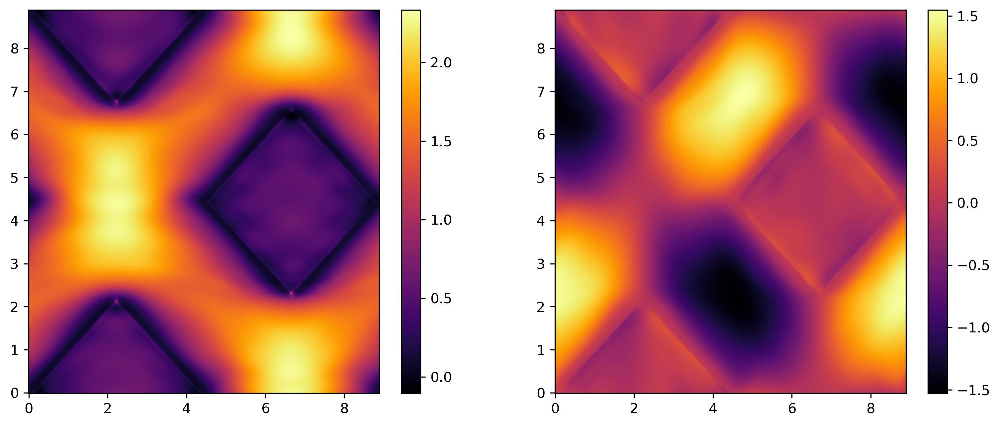

In [20]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(12.5,5), dpi=300)
pos1 = axs[0].pcolormesh(XY[0], XY[1], q_d[:,0].detach().cpu().reshape(N, N), cmap='inferno')
fig.colorbar(pos1, ax=axs[0])
pos2 = axs[1].pcolormesh(XY[0], XY[1], q_d[:,1].detach().cpu().reshape(N, N), cmap='inferno')
fig.colorbar(pos2, ax=axs[1])

In [66]:
net_primal = PINN(n_periodic=5, n_hidden=10, n_layers=2, period_len=L)
total_params = sum(p.numel() for p in net_primal.parameters())
print(f"Number of parameters: {total_params}")
args = {'lr' : 0.0001, 'epochs' : 30000, 'dev' : dev, 'name' : f'NN_library/PINN/rot/PINN_primal_inv_{total_params}'}

Number of parameters: 391


In [67]:
losses_train, losses_val = train_primal(net_primal, loaders, args, A_interp_inv, H1, L)

Epoch: 0 mean train loss:  3.67990997e+02, bound:  3.12994885e+00
Epoch: 1 mean train loss:  3.67844788e+02, bound:  3.12985563e+00
Epoch: 2 mean train loss:  3.67699036e+02, bound:  3.12977099e+00
Epoch: 3 mean train loss:  3.67553711e+02, bound:  3.12968755e+00
Epoch: 4 mean train loss:  3.67408783e+02, bound:  3.12960601e+00
Epoch: 5 mean train loss:  3.67264252e+02, bound:  3.12952638e+00
Epoch: 6 mean train loss:  3.67120209e+02, bound:  3.12944841e+00
Epoch: 7 mean train loss:  3.66976562e+02, bound:  3.12937212e+00
Epoch: 8 mean train loss:  3.66833405e+02, bound:  3.12929726e+00
Epoch: 9 mean train loss:  3.66690704e+02, bound:  3.12922311e+00
Epoch: 10 mean train loss:  3.66548523e+02, bound:  3.12914968e+00
Epoch: 11 mean train loss:  3.66406708e+02, bound:  3.12907696e+00
Epoch: 12 mean train loss:  3.66265442e+02, bound:  3.12900496e+00
Epoch: 13 mean train loss:  3.66124634e+02, bound:  3.12893319e+00
Epoch: 14 mean train loss:  3.65984314e+02, bound:  3.12886190e+00
Epoch

In [68]:
np.save(f'NN_library/training_data/rot/PINN_primal_inv_{total_params}', np.vstack([losses_train, losses_val]))

Using device: cuda


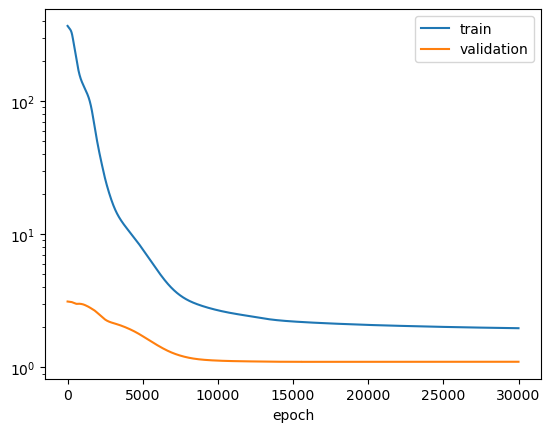

In [69]:
plt.plot(losses_train)
plt.plot(losses_val)
plt.xlabel('epoch')
plt.legend(['train', 'validation'])
plt.yscale('log')

In [ ]:
U1 = net_primal(grid_data).detach().cpu()
error_1, q = PDE_loss(grid_data, net_primal, A_interp, H1)

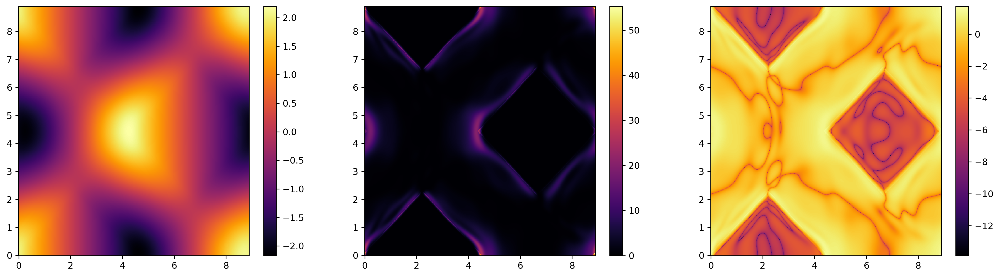

In [71]:
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(19.5,5), dpi=300)
pos1 = axs[0].pcolormesh(XY[0], XY[1], U1.reshape(N, N), cmap='inferno')
fig.colorbar(pos1, ax=axs[0])
pos2 = axs[1].pcolormesh(XY[0], XY[1], error_1.detach().cpu().reshape(N, N), cmap='inferno')
fig.colorbar(pos2, ax=axs[1])
pos3 = axs[2].pcolormesh(XY[0], XY[1], np.log10(error_1.detach().cpu().reshape(N, N)), cmap='inferno')
fig.colorbar(pos3, ax=axs[2])

In [21]:
net_dual = PINN(n_periodic=5, n_hidden=10, n_layers=2, period_len=L)
total_params = sum(p.numel() for p in net_dual.parameters())
print(f"Number of parameters: {total_params}")
args = {'lr' : 0.0001, 'epochs' : 30000, 'dev' : dev, 'name' : f'NN_library/PINN/rot/PINN_dual_inv_{total_params}'}

Number of parameters: 391


In [22]:
losses_train, losses_val = train_dual(net_dual, loaders, args, A_interp, H1, L)

Epoch: 0 mean train loss:  1.04720628e+00, bound:  1.29695368e+00
Epoch: 1 mean train loss:  1.04681039e+00, bound:  1.29698420e+00
Epoch: 2 mean train loss:  1.04641736e+00, bound:  1.29701483e+00
Epoch: 3 mean train loss:  1.04602695e+00, bound:  1.29704499e+00
Epoch: 4 mean train loss:  1.04563940e+00, bound:  1.29707491e+00
Epoch: 5 mean train loss:  1.04525447e+00, bound:  1.29710495e+00
Epoch: 6 mean train loss:  1.04487252e+00, bound:  1.29713452e+00
Epoch: 7 mean train loss:  1.04449332e+00, bound:  1.29716432e+00
Epoch: 8 mean train loss:  1.04411721e+00, bound:  1.29719400e+00
Epoch: 9 mean train loss:  1.04374373e+00, bound:  1.29722345e+00
Epoch: 10 mean train loss:  1.04337335e+00, bound:  1.29725301e+00
Epoch: 11 mean train loss:  1.04300594e+00, bound:  1.29728270e+00
Epoch: 12 mean train loss:  1.04264128e+00, bound:  1.29731226e+00
Epoch: 13 mean train loss:  1.04227960e+00, bound:  1.29734170e+00
Epoch: 14 mean train loss:  1.04192102e+00, bound:  1.29737163e+00
Epoch

In [23]:
U2 = net_dual(grid_data)
error_2, q_d = PDE_loss_dual(grid_data, net_dual, A_interp, H1)

Using device: cuda


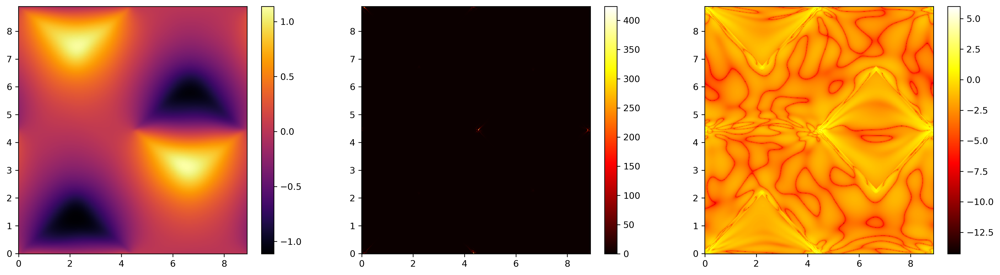

In [24]:
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(19.5,5), dpi=300)
pos1 = axs[0].pcolormesh(XY[0], XY[1], U2.detach().cpu().reshape(N, N), cmap='inferno')
fig.colorbar(pos1, ax=axs[0])
pos2 = axs[1].pcolormesh(XY[0], XY[1], error_2.detach().cpu().reshape(N, N), cmap='hot')
fig.colorbar(pos2, ax=axs[1])
pos3 = axs[2].pcolormesh(XY[0], XY[1], np.log10(error_2.detach().cpu().reshape(N, N)), cmap='hot', vmax=6)
fig.colorbar(pos3, ax=axs[2])